## 1. Setup

In [1]:
import torch, os, glob, numpy as np
import torch.nn as nn
import importlib, subprocess, sys
for pkg in ["skimage", "cv2"]:
    if importlib.util.find_spec(pkg) is None:
        subprocess.run([sys.executable,"-m","pip","install","-q",
                        "scikit-image" if pkg=="skimage" else "opencv-python-headless"])
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import cv2
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)
EPS = 1e-6
EULER = 0.5772156649

device: cuda


## 2. Locate the checkpoint


In [2]:
CKPT = None
# --- Option A: Google Drive ---
try:
    from google.colab import drive
    drive.mount("/content/drive")
    cand = glob.glob("/content/drive/MyDrive/sarcnn_synthetic/model_*.pth")
    if cand:
        def epnum(p):
            import re; m=re.search(r"model_(\d+)\.pth$", p); return int(m.group(1)) if m else 0
        CKPT = max(cand, key=epnum)   # highest-epoch weights file
    elif os.path.exists("/content/drive/MyDrive/sarcnn_synthetic/last.pth"):
        CKPT = "/content/drive/MyDrive/sarcnn_synthetic/last.pth"
except Exception as e:
    print("Drive not mounted:", e)

# --- Option B: manual upload fallback ---
if CKPT is None:
    for guess in ["model_050.pth", "last.pth"] + sorted(glob.glob("model_*.pth")):
        if os.path.exists(guess): CKPT = guess; break

assert CKPT and os.path.exists(CKPT), "No checkpoint found - mount Drive or upload model_050.pth / last.pth."
print("Using checkpoint:", CKPT)

Mounted at /content/drive
Using checkpoint: /content/drive/MyDrive/sarcnn_synthetic/model_050.pth


## 3. Build the architecture and load the weights


In [3]:
import urllib.request, types
RAW = "https://raw.githubusercontent.com/cszn/DnCNN/master/TrainingCodes/dncnn_pytorch"
for fn in ["data_generator.py", "main_train.py"]:
    if not os.path.exists(fn):
        urllib.request.urlretrieve(f"{RAW}/{fn}", fn)

def import_authors_classes(path="main_train.py"):
    lines = open(path).read().splitlines()
    def idx(pred):
        for i,l in enumerate(lines):
            if pred(l): return i
        return -1
    i_arg = idx(lambda l: l.strip().startswith("parser = argparse"))
    i_cls = idx(lambda l: l.startswith("class "))
    i_main= idx(lambda l: l.strip().startswith("if __name__"))
    head = lines[:i_arg] + [""] + lines[i_cls : (i_main if i_main!=-1 else len(lines))]
    mod = types.ModuleType("authors_dncnn")
    exec(compile("\n".join(head), "authors_dncnn", "exec"), mod.__dict__)
    return mod

DEPTH = 17
DnCNN = import_authors_classes().DnCNN
model = DnCNN(depth=DEPTH).to(device)

ckpt = torch.load(CKPT, map_location=device)
history = []
C_LOGSPECKLE = -EULER/2.0     # default; overwritten if the bundle stored it
if isinstance(ckpt, dict) and "model_state" in ckpt:
    state = ckpt["model_state"]
    history = ckpt.get("history", [])
    C_LOGSPECKLE = ckpt.get("config", {}).get("C_LOGSPECKLE", C_LOGSPECKLE)
    print(f"Loaded bundle: {ckpt.get('epoch','?')} epochs, history len {len(history)}, c={C_LOGSPECKLE:.5f}")
else:
    state = ckpt
    print("Loaded weights-only state_dict.")

missing, unexpected = model.load_state_dict(state, strict=False)
print(f"load: missing {len(missing)} | unexpected {len(unexpected)}")
model.eval()
print("Model ready, eval mode.")

init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
Loaded weights-only state_dict.
load: missing 0 | unexpected 0
Model ready, eval mode.


## 4. Load Set12 (the paper's synthetic test images)

In [4]:
os.makedirs("Set12", exist_ok=True)
base = "https://raw.githubusercontent.com/cszn/DnCNN/master/testsets/Set12"
imgs, names = [], []
for n in range(1,13):
    p = f"Set12/{n:02d}.png"
    if not os.path.exists(p):
        try: urllib.request.urlretrieve(f"{base}/{n:02d}.png", p)
        except Exception as e: print("dl fail", n, e)
    if os.path.exists(p):
        imgs.append(cv2.imread(p,0).astype("float32")/255.0); names.append(f"{n:02d}")
print("Set12 images:", len(imgs))

Set12 images: 12


## 5. Speckle + homomorphic despeckle


In [5]:
LOOKS = 1
def add_speckle(clean_amp, looks=LOOKS, rng=None):
    if rng is None: rng = np.random
    clean_int = np.clip(clean_amp, EPS, None) ** 2
    acc = np.zeros_like(clean_int)
    for _ in range(looks):
        re = rng.standard_normal(clean_int.shape)/np.sqrt(2)
        im = rng.standard_normal(clean_int.shape)/np.sqrt(2)
        acc += re*re + im*im
    speckle = acc/looks
    return np.sqrt(np.clip(clean_int*speckle, EPS, None)).astype("float32")

@torch.no_grad()
def despeckle(net, noisy_amp):
    # The authors' DnCNN.forward returns x - dncnn(x), so net(log_noisy) IS the
    # predicted clean log-image. Despeckled amplitude = exp(net(log_noisy)).
    ln = np.log(np.clip(noisy_amp, EPS, None)).astype("float32")
    t = torch.from_numpy(ln).unsqueeze(0).unsqueeze(0).to(device)
    P = net(t)                                  # predicted CLEAN log-image
    return torch.exp(P).squeeze().cpu().numpy()

## 6. Evaluate on Set12 (PSNR / SSIM)

In [6]:
rows = []
for k,(clean,nm) in enumerate(zip(imgs,names)):
    rng = np.random.default_rng(k)
    noisy = add_speckle(clean, LOOKS, rng)
    den = despeckle(model, noisy).clip(0,1)
    p = psnr(clean, den, data_range=1.0)
    s = ssim(clean, den, data_range=1.0)
    rows.append((nm, p, s))
    print(f"  {nm}: PSNR {p:5.2f} dB | SSIM {s:.3f}")

avg_p = np.mean([r[1] for r in rows]); avg_s = np.mean([r[2] for r in rows])
print(f"\nSet12 average: PSNR {avg_p:.2f} dB | SSIM {avg_s:.3f}")
print("Paper (synthetic, single-look) SAR-CNN average: ~25.95 dB PSNR / ~0.764 SSIM "
      "(Tables 2-3; on their data+speckle, so expect ballpark not exact).")

  01: PSNR 26.27 dB | SSIM 0.777
  02: PSNR 28.14 dB | SSIM 0.783
  03: PSNR 26.41 dB | SSIM 0.787
  04: PSNR 23.36 dB | SSIM 0.708
  05: PSNR 26.26 dB | SSIM 0.842
  06: PSNR 23.89 dB | SSIM 0.711
  07: PSNR 26.02 dB | SSIM 0.804
  08: PSNR 28.65 dB | SSIM 0.793
  09: PSNR 24.70 dB | SSIM 0.725
  10: PSNR 26.14 dB | SSIM 0.676
  11: PSNR 26.61 dB | SSIM 0.704
  12: PSNR 26.13 dB | SSIM 0.693

Set12 average: PSNR 26.05 dB | SSIM 0.750
Paper (synthetic, single-look) SAR-CNN average: ~25.95 dB PSNR / ~0.764 SSIM (Tables 2-3; on their data+speckle, so expect ballpark not exact).


## 7. Visual check: clean / noisy / despeckled / residual


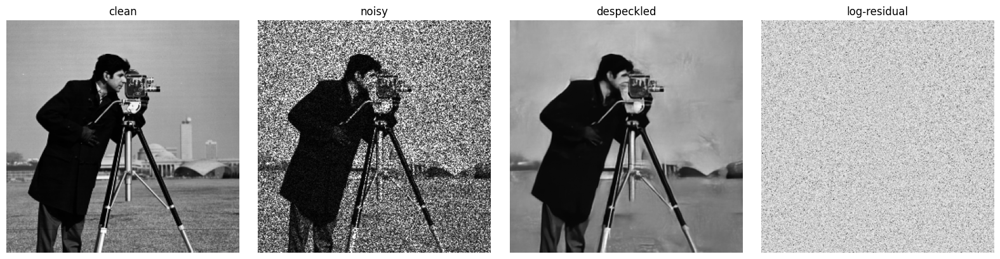

image 01: PSNR 26.27 dB SSIM 0.777


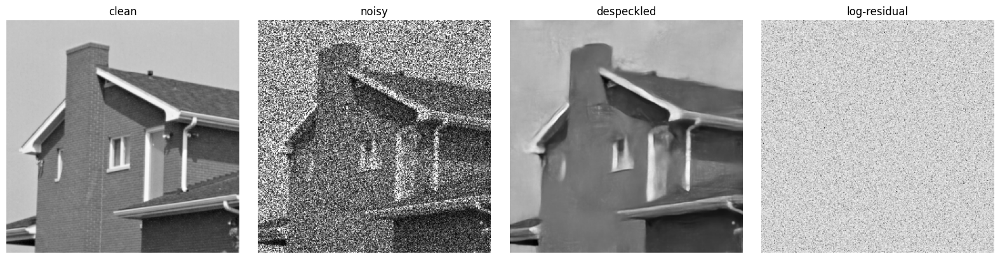

image 02: PSNR 28.14 dB SSIM 0.783


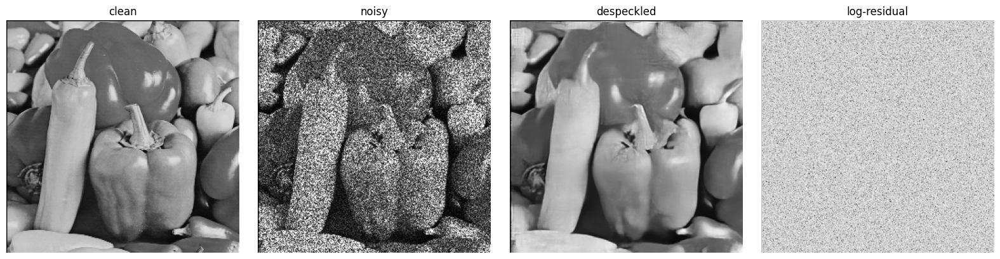

image 03: PSNR 26.41 dB SSIM 0.787


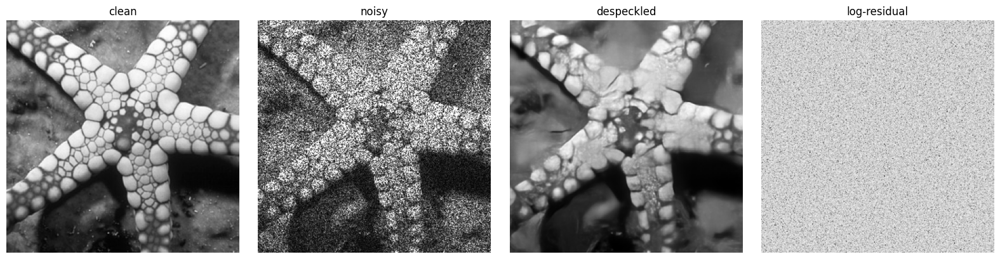

image 04: PSNR 23.36 dB SSIM 0.708


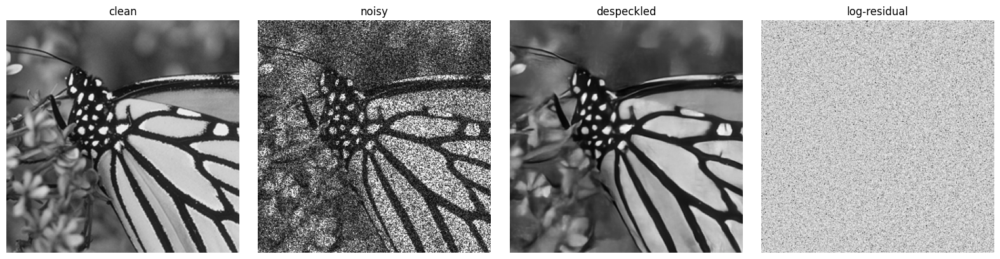

image 05: PSNR 26.26 dB SSIM 0.842


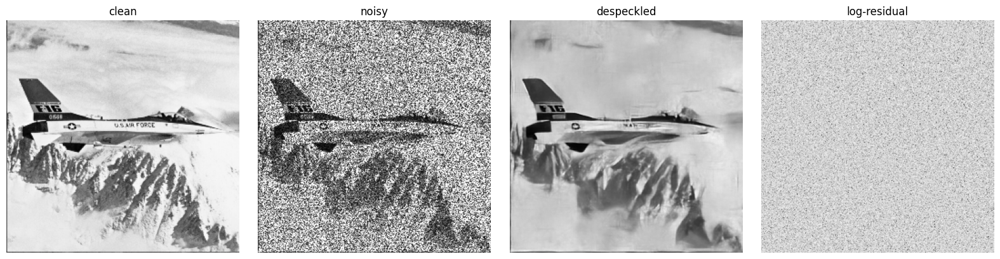

image 06: PSNR 23.89 dB SSIM 0.711


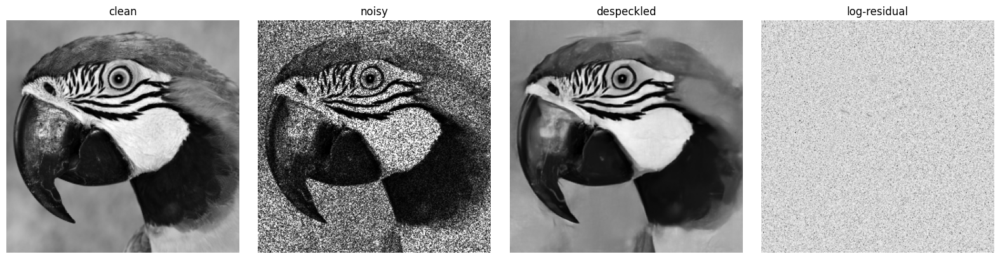

image 07: PSNR 26.02 dB SSIM 0.804


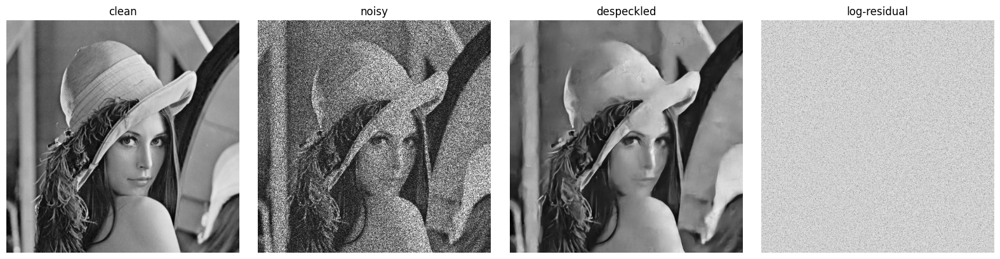

image 08: PSNR 28.65 dB SSIM 0.793


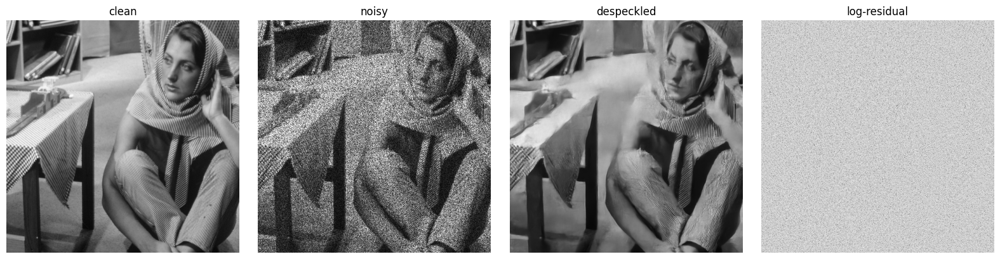

image 09: PSNR 24.70 dB SSIM 0.725


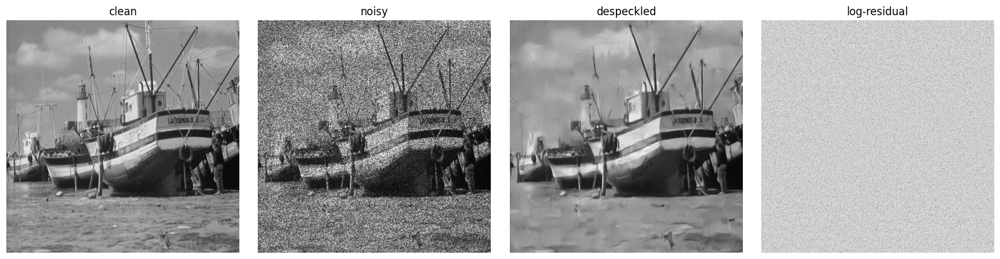

image 10: PSNR 26.14 dB SSIM 0.676


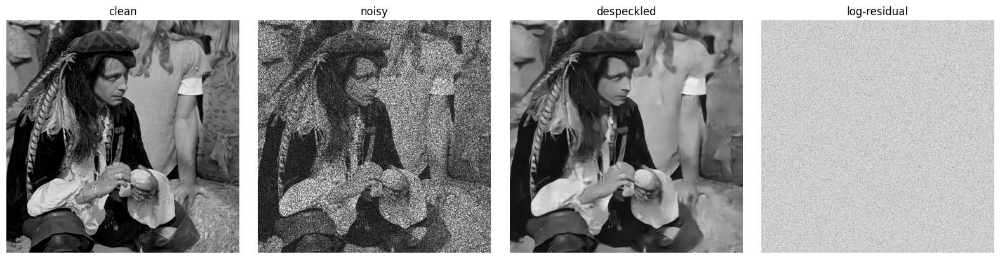

image 11: PSNR 26.61 dB SSIM 0.704


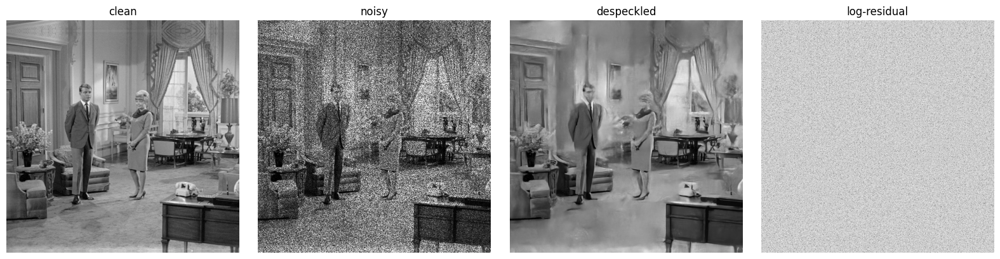

image 12: PSNR 26.13 dB SSIM 0.693


In [16]:
import matplotlib.pyplot as plt
idxs = range(12)   # which Set12 image to show
for idx in idxs:
  clean = imgs[idx]
  rng = np.random.default_rng(idx)
  noisy = add_speckle(clean, LOOKS, rng)
  den = despeckle(model, noisy).clip(0,1)
  resid = np.log(np.clip(noisy,EPS,None)) - np.log(np.clip(den,EPS,None))

  fig, ax = plt.subplots(1,4, figsize=(16,4))
  for a,(im,t) in zip(ax, [(clean,"clean"),(noisy.clip(0,1),"noisy"),
                          (den,"despeckled"),(resid,"log-residual")]):
      a.imshow(im, cmap="gray"); a.set_title(t); a.axis("off")
  plt.tight_layout(); plt.show()
  print(f"image {names[idx]}: PSNR {psnr(clean,den,data_range=1.0):.2f} dB "
        f"SSIM {ssim(clean,den,data_range=1.0):.3f}")